In [1]:
import uproot
import numpy as np
import matplotlib.pyplot as plt

In [2]:
#############################
# Read file
#############################

file = 'networkScores_notAllLinks'
outputFile = '/Users/isobel/Desktop/DUNE/2024/Hierarchy/files/' + file + '.npz'

print('Reading file: ', str(outputFile),', This may take a while...')

data = np.load(outputFile)

particle_mask_in = data['particle_mask']
trueTrackID_in = data['trueTrackID']
trueVisibleGeneration_in = data['trueVisibleGeneration']
trueVisibleParentTrackID_in = data['trueVisibleParentTrackID']
particleIndex_in = data['particleIndex']
primaryScores_in = data['primaryScores']
link_mask_in = data['link_mask']
higherTierChildIndex_in = data['higherTierChildIndex']
higherTierParentIndex_in = data['higherTierParentIndex']
higherTierScores_in = data['higherTierScores']

nEntries = len(trueVisibleGeneration_in)

print('nEntries:', nEntries)

Reading file:  /Users/isobel/Desktop/DUNE/2024/Hierarchy/files/networkScores_notAllLinks.npz , This may take a while...
nEntries: 98400


In [3]:
############################
# Tune primaries
############################

# NEED TO ACTUALLY GET RID OF THOSE THAT DONT HAVE ANY TRUTH! AGHHHHHHH



In [5]:
############################
# Tune primaries
############################

primary_thresholds = []
primary_efficiency = []
primary_purity = []
primary_metric = []

primaries_as_primaries_frac = []
primaries_as_other_frac = []
other_as_primaries_frac = []
other_as_other_frac = []

############################
# Loop through thresholds
############################
for primary_threshold in range(0, 11) :
    
    primary_threshold /= float(10)
    
    primary_thresholds.append(primary_threshold)
    
    n_true_primaries = 0
    n_primaries_as_primaries = 0
    n_primaries_as_other = 0

    n_true_other = 0
    n_other_as_primaries = 0
    n_other_as_other = 0

    ############################
    # Loop through events
    ############################
    for iEvent in range(nEntries) :

        particle_mask = np.array(particle_mask_in[iEvent])
        particleIndex = np.array(particleIndex_in[iEvent])[particle_mask]
        trueVisibleGeneration = np.array(trueVisibleGeneration_in[iEvent])[particle_mask]
        primaryScores = np.array(primaryScores_in[iEvent])[particle_mask]
        
        nParticles = len(particleIndex)
        
        for iParticle in range(nParticles) :

            if (trueVisibleGeneration[iParticle] == 2) :

                n_true_primaries += 1

                if (primaryScores[iParticle] > primary_threshold) :
                    n_primaries_as_primaries += 1
                else :
                    n_primaries_as_other += 1
            else :

                n_true_other += 1

                if (primaryScores[iParticle] > primary_threshold) :
                    n_other_as_primaries += 1
                else :
                    n_other_as_other += 1
                    
                    
    ############################
    # Work out metrics
    ############################
    selected_primaries = n_primaries_as_primaries + n_other_as_primaries
    primary_efficiency.append(0 if n_true_primaries == 0 else float(n_primaries_as_primaries)/float(n_true_primaries))
    primary_purity.append(0 if selected_primaries == 0 else float(n_primaries_as_primaries)/float(selected_primaries))
    primary_metric.append(primary_efficiency[-1] * primary_purity[-1])
    
    primaries_as_primaries_frac.append(float(n_primaries_as_primaries) / float(n_true_primaries))
    primaries_as_other_frac.append(float(n_primaries_as_other) / float(n_true_primaries))
    other_as_primaries_frac.append(float(n_other_as_primaries) / float(n_true_other))
    other_as_other_frac.append(float(n_other_as_other) / float(n_true_other))

In [8]:
jam1 = np.array([1, 2, 3])
jam2 = np.array([3, 3, 3])

print(jam1*jam2)

[3 6 9]


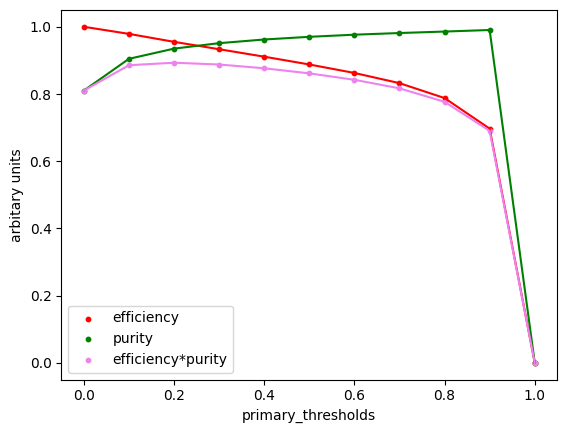

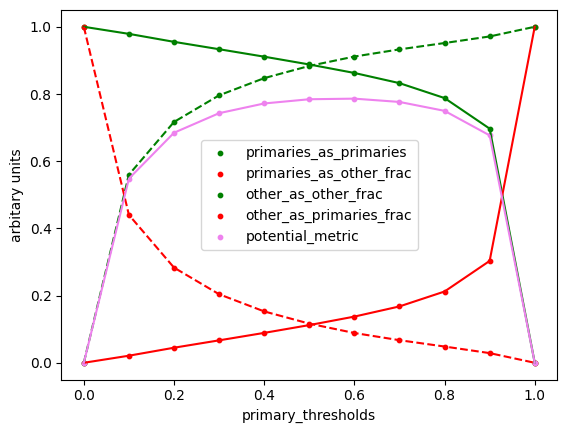

In [16]:
potential_metric = np.array(primaries_as_primaries_frac) * np.array(other_as_other_frac)



############################
# Primary plot!
############################

plt.clf()
plt.scatter(primary_thresholds, primary_efficiency, color='red', label='efficiency', s=10)
plt.plot(primary_thresholds, primary_efficiency, color='red')
plt.scatter(primary_thresholds, primary_purity, color='green', label='purity', s=10)
plt.plot(primary_thresholds, primary_purity, color='green')
plt.scatter(primary_thresholds, primary_metric, color='violet', label='efficiency*purity', s=10)
plt.plot(primary_thresholds, primary_metric, color='violet')
    
plt.xlabel('primary_thresholds')
plt.ylabel('arbitary units')
plt.legend()
plt.show()

############################

plt.clf()
plt.scatter(primary_thresholds, primaries_as_primaries_frac, color='green', label='primaries_as_primaries', s=10)
plt.plot(primary_thresholds, primaries_as_primaries_frac, color='green')
plt.scatter(primary_thresholds, primaries_as_other_frac, color='red', label='primaries_as_other_frac', s=10)
plt.plot(primary_thresholds, primaries_as_other_frac, color='red')
plt.scatter(primary_thresholds, other_as_other_frac, color='green', label='other_as_other_frac', s=10)
plt.plot(primary_thresholds, other_as_other_frac, color='green', linestyle='dashed')
plt.scatter(primary_thresholds, other_as_primaries_frac, color='red', label='other_as_primaries_frac', s=10)
plt.plot(primary_thresholds, other_as_primaries_frac, color='red', linestyle='dashed')


plt.scatter(primary_thresholds, potential_metric, color='violet', label='potential_metric', s=10)
plt.plot(primary_thresholds, potential_metric, color='violet')


plt.xlabel('primary_thresholds')
plt.ylabel('arbitary units')
plt.legend()
plt.show()

In [4]:
#######################################
# Define optimal primary threshold
#######################################

PRIMARY_THRESHOLD = 0.6

In [5]:
##################################################
# Build the primary tier with optimised threshold!
##################################################

new_gen = []
new_parentTrackID = []

primaries = []

for iEvent in range(nEntries) :

    particle_mask = np.array(particle_mask_in[iEvent])
    particleIndex = np.array(particleIndex_in[iEvent])[particle_mask]
    primaryScores = np.array(primaryScores_in[iEvent])[particle_mask]
    nParticles = len(particleIndex)
    
    this_parentTrackID = [-1] * nParticles
    this_gen = [-1] * nParticles
    
    this_primaries = []
    
    for iParticle in range(nParticles) :
        
        if (primaryScores[iParticle] > PRIMARY_THRESHOLD) :
            this_primaries.append(iParticle)
            this_gen[iParticle] = 2
            this_parentTrackID[iParticle] = 0
    
    new_gen.append(this_gen)
    new_parentTrackID.append(this_parentTrackID)
    primaries.append(this_primaries)

In [19]:
############################
# Tune higher tiers
############################

higher_thresholds = []

secondary_correct_parent_frac = []
secondary_no_parent_frac = []
secondary_incorrect_parent_frac = []

higher_correct_parent_frac = []
higher_no_parent_frac = []
higher_incorrect_parent_frac = []

############################
# Loop through thresholds
############################
for higher_threshold in range(0, 11) :
    
    higher_threshold /= float(10)
    
    higher_thresholds.append(higher_threshold)

    n_secondary = 0
    secondary_correct_parent = 0
    secondary_no_parent = 0
    secondary_incorrect_parent = 0

    n_higher = 0
    higher_correct_parent = 0
    higher_no_parent = 0
    higher_incorrect_parent = 0

    ############################
    # Loop through events
    ############################

    for iEvent in range(nEntries) :

        this_particle_tiers = [[]]
        this_particle_tiers[0] = primaries[iEvent]

        this_parentTrackID = new_parentTrackID[iEvent].copy()
        this_gen = new_gen[iEvent].copy()
        
        particle_mask = np.array(particle_mask_in[iEvent])       
        trueTrackID = np.array(trueTrackID_in[iEvent])[particle_mask]
        trueVisibleGeneration = np.array(trueVisibleGeneration_in[iEvent])[particle_mask]
        trueVisibleParentTrackID = np.array(trueVisibleParentTrackID_in[iEvent])[particle_mask]
        particleIndex = np.array(particleIndex_in[iEvent])[particle_mask]
        
        link_mask = np.array(link_mask_in[iEvent])
        higherTierChildIndex = np.array(higherTierChildIndex_in[iEvent])[link_mask]
        higherTierParentIndex = np.array(higherTierParentIndex_in[iEvent])[link_mask]
        higherTierScores = np.array(higherTierScores_in[iEvent])[link_mask]

        ############################
        # Build hierarchy
        ############################    

        # Fill each tier at a time
        while (len(this_particle_tiers[-1]) != 0) :

            tier = []

            # Have to find the highest link out of all possible links - to ensure best links are made        
            found = True

            while (found) :
        
                iFoundParent = -1
                iFoundChild = -1
                highestLinkScore = -1
                found = False

                # Loop over particles in last built tier
                for iParent in this_particle_tiers[-1]:

                    this_parentIndex = particleIndex[iParent]

                    # Loop over its links
                    for iLink in (np.where(higherTierParentIndex == this_parentIndex)[0]) : 

                        this_childIndex = higherTierChildIndex[iLink]
                        iChild = np.where(particleIndex == this_childIndex)[0][0]

                        # If the child has already been assigned a parent
                        if (this_gen[iChild] != -1) :
                            continue

                        this_higherTierScore = higherTierScores[iLink]
                        
                        if ((this_higherTierScore > highestLinkScore) and (this_higherTierScore > higher_threshold)) :

                            highestLinkScore = this_higherTierScore
                            iFoundParent = iParent
                            iFoundChild = iChild
                            found = True
                            
                # If link found, add into this tier
                if (found) :
                    this_parentTrackID[iFoundChild] = trueTrackID[iFoundParent]
                    this_gen[iFoundChild] = len(this_particle_tiers) + 2
                    tier.append(iFoundChild)

            # Tier complete, add into hierarchy
            this_particle_tiers.append(tier)
    
        ############################
        # Add counts for event
        ############################    
        this_parentTrackID = np.array(this_parentTrackID)
        this_gen = np.array(this_gen)

        true_secondary_mask = (trueVisibleGeneration == 3)
        n_secondary += np.count_nonzero(true_secondary_mask)
        secondary_correct_parent += np.count_nonzero(trueVisibleParentTrackID[true_secondary_mask] == this_parentTrackID[true_secondary_mask])
        secondary_no_parent += np.count_nonzero(this_gen[true_secondary_mask] == -1)
        secondary_incorrect_parent += np.count_nonzero(np.logical_and(this_gen[true_secondary_mask] != -1, \
                                                                      trueVisibleParentTrackID[true_secondary_mask] != this_parentTrackID[true_secondary_mask]))
        true_higher_mask = trueVisibleGeneration > 3
        n_higher += np.count_nonzero(true_higher_mask)
        higher_correct_parent += np.count_nonzero(trueVisibleParentTrackID[true_higher_mask] == this_parentTrackID[true_higher_mask])
        higher_no_parent += np.count_nonzero(this_gen[true_higher_mask] == -1)
        higher_incorrect_parent += np.count_nonzero(np.logical_and(this_gen[true_higher_mask] != -1, \
                                                                   trueVisibleParentTrackID[true_higher_mask] != this_parentTrackID[true_higher_mask]))
        
    ############################
    # Calculate metrics for threshold
    ############################      
    secondary_correct_parent_frac.append(0 if n_secondary == 0 else float(secondary_correct_parent)/float(n_secondary))
    secondary_no_parent_frac.append(0 if n_secondary == 0 else float(secondary_no_parent)/float(n_secondary))
    secondary_incorrect_parent_frac.append(0 if n_secondary == 0 else float(secondary_incorrect_parent)/float(n_secondary))
    higher_correct_parent_frac.append(0 if n_higher == 0 else float(higher_correct_parent)/float(n_higher))
    higher_no_parent_frac.append(0 if n_higher == 0 else float(higher_no_parent)/float(n_higher))
    higher_incorrect_parent_frac.append(0 if n_higher == 0 else float(higher_incorrect_parent)/float(n_higher))

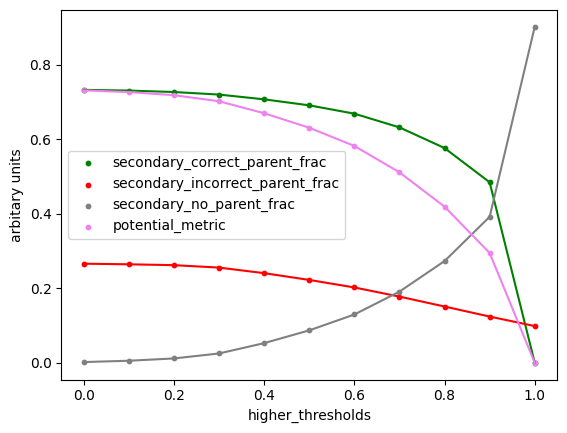

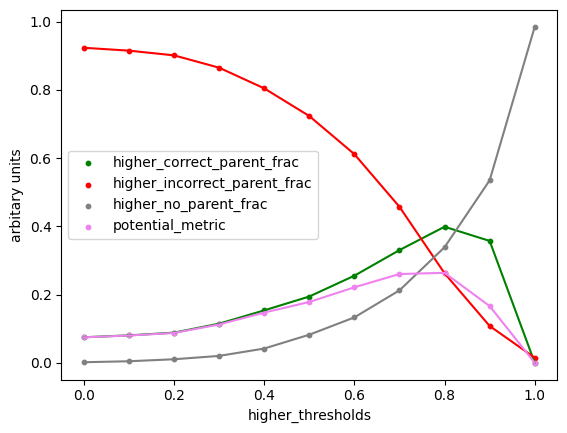

In [23]:
potential_secondary_metric = np.array(secondary_correct_parent_frac) * (1 - np.array(secondary_no_parent_frac))
potential_higher_metric = np.array(higher_correct_parent_frac) * (1 - np.array(higher_no_parent_frac))

############################
# Higher tier plot!
############################

plt.clf()
plt.scatter(higher_thresholds, secondary_correct_parent_frac, color='green', label='secondary_correct_parent_frac', s=10)
plt.plot(higher_thresholds, secondary_correct_parent_frac, color='green')

plt.scatter(higher_thresholds, secondary_incorrect_parent_frac, color='red', label='secondary_incorrect_parent_frac', s=10)
plt.plot(higher_thresholds, secondary_incorrect_parent_frac, color='red')

plt.scatter(higher_thresholds, secondary_no_parent_frac, color='gray', label='secondary_no_parent_frac', s=10)
plt.plot(higher_thresholds, secondary_no_parent_frac, color='gray')

plt.scatter(higher_thresholds, potential_secondary_metric, color='violet', label='potential_metric', s=10)
plt.plot(higher_thresholds, potential_secondary_metric, color='violet')
    
plt.xlabel('higher_thresholds')
plt.ylabel('arbitary units')
plt.legend()
plt.show()

############################

plt.clf()
plt.scatter(higher_thresholds, higher_correct_parent_frac, color='green', label='higher_correct_parent_frac', s=10)
plt.plot(higher_thresholds, higher_correct_parent_frac, color='green')

plt.scatter(higher_thresholds, higher_incorrect_parent_frac, color='red', label='higher_incorrect_parent_frac', s=10)
plt.plot(higher_thresholds, higher_incorrect_parent_frac, color='red')

plt.scatter(higher_thresholds, higher_no_parent_frac, color='gray', label='higher_no_parent_frac', s=10)
plt.plot(higher_thresholds, higher_no_parent_frac, color='gray')

plt.scatter(higher_thresholds, potential_higher_metric, color='violet', label='potential_metric', s=10)
plt.plot(higher_thresholds, potential_higher_metric, color='violet')

plt.xlabel('higher_thresholds')
plt.ylabel('arbitary units')
plt.legend()
plt.show()

In [6]:
#######################################
# Define optimal higher threshold
#######################################

HIGHER_THRESHOLD = 0.7

In [7]:
##################################################
# Build the higher tier with optimised threshold!
##################################################

############################
# Loop through events
############################

for iEvent in range(nEntries) :

    this_particle_tiers = [[]]
    this_particle_tiers[0] = primaries[iEvent]

    this_parentTrackID = new_parentTrackID[iEvent] # Will not make a copy (will be by reference)
    this_gen = new_gen[iEvent] # Will not make a copy (will be by reference)
        
    particle_mask = np.array(particle_mask_in[iEvent])       
    trueTrackID = np.array(trueTrackID_in[iEvent])[particle_mask]
    #trueVisibleGeneration = np.array(trueVisibleGeneration_in[iEvent])[particle_mask]
    #trueVisibleParentTrackID = np.array(trueVisibleParentTrackID_in[iEvent])[particle_mask]
    particleIndex = np.array(particleIndex_in[iEvent])[particle_mask]
        
    link_mask = np.array(link_mask_in[iEvent])
    higherTierChildIndex = np.array(higherTierChildIndex_in[iEvent])[link_mask]
    higherTierParentIndex = np.array(higherTierParentIndex_in[iEvent])[link_mask]
    higherTierScores = np.array(higherTierScores_in[iEvent])[link_mask]
    
    print('this_parentTrackID:', this_parentTrackID)
    print('this_gen:', this_gen)
    print('trueTrackID:', trueTrackID)
    

    ############################
    # Build hierarchy
    ############################    

    # Fill each tier at a time
    while (len(this_particle_tiers[-1]) != 0) :

        tier = []

        # Have to find the highest link out of all possible links - to ensure best links are made        
        found = True

        while (found) :
        
            iFoundParent = -1
            iFoundChild = -1
            highestLinkScore = -1
            found = False

            # Loop over particles in last built tier
            for iParent in this_particle_tiers[-1]:

                this_parentIndex = particleIndex[iParent]

                # Loop over its links
                for iLink in (np.where(higherTierParentIndex == this_parentIndex)[0]) : 

                    this_childIndex = higherTierChildIndex[iLink]
                    iChild = np.where(particleIndex == this_childIndex)[0][0]

                    # If the child has already been assigned a parent
                    if (this_gen[iChild] != -1) :
                        continue

                    this_higherTierScore = higherTierScores[iLink]
                        
                    if ((this_higherTierScore > highestLinkScore) and (this_higherTierScore > HIGHER_THRESHOLD)) :

                        highestLinkScore = this_higherTierScore
                        iFoundParent = iParent
                        iFoundChild = iChild
                        found = True
                            
            # If link found, add into this tier
            if (found) :
                
                print('trueTrackID[iFoundParent]:', trueTrackID[iFoundParent])
                print('iFoundParent:', iFoundParent)
                print('iFoundChild:', iFoundChild)
                
                this_parentTrackID[iFoundChild] = trueTrackID[iFoundParent]
                this_gen[iFoundChild] = len(this_particle_tiers) + 2
                tier.append(iFoundChild)

        # Tier complete, add into hierarchy
        this_particle_tiers.append(tier)

this_parentTrackID: [0, 0, 0, -1, -1, -1, 0, -1]
this_gen: [2, 2, 2, -1, -1, -1, 2, -1]
trueTrackID: [   1    5 1186  295   25  273 1185  521]
trueTrackID[iFoundParent]: 5
iFoundParent: 1
iFoundChild: 4
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [2 2 9]
this_parentTrackID: [0, 0, -1, 0]
this_gen: [2, 2, -1, 2]
trueTrackID: [ 1  4 13  3]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2]
trueTrackID: [2 2 2 2 2 1]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 3]
this_parentTrackID: [0, 0, 0, -1, 0]
this_gen: [2, 2, 2, -1, 2]
trueTrackID: [  2   6   3 840  11]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2]
trueTrackID: [  1   2   5   6 303   5   3]
this_parentTrackID: [0, -1]
this_gen: [2, -1]
trueTrackID: [ 3 34]
trueTrackID[iFoundParent]: 3
iFoundParent

this_parentTrackID: [0, 0, -1]
this_gen: [2, 2, -1]
trueTrackID: [ 1  2 13]
trueTrackID[iFoundParent]: 2
iFoundParent: 1
iFoundChild: 2
this_parentTrackID: [0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2]
trueTrackID: [1 8 2 7 5 7]
this_parentTrackID: [0, 0, 0, 0, -1, 0, 0]
this_gen: [2, 2, 2, 2, -1, 2, 2]
trueTrackID: [  1 338 926   1 132 926 927]
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [ 1 19 19 18 19]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [6]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, -1, 0, 0, 0, -1, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2, -1, 2, 2, 2, -1, 2, 2]
trueTrackID: [ 4124    10    10     1  8237  6758  6757  8241  6757 11477     7  3399
  6758  6758]
trueTrackID[iFoundParent]: 7
iFoundParent: 10
iFoundChild: 11
this_parentTrackID: [0, -1, -1, -1]
this_gen: [2, -1, -1, -1]
trueTrackID: [  3   7 697 837]
trueTrackID[iFoundParent]: 3
iFoundParent: 0
iFoundChild: 2
trueTrackID[iFou

this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: [0, 0, -1, -1, 0, -1]
this_gen: [2, 2, -1, -1, 2, -1]
trueTrackID: [   1    4    3 1528    5    5]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [ 1 11  2  3]
this_parentTrackID: [0, -1, 0, 0, 0]
this_gen: [2, -1, 2, 2, 2]
trueTrackID: [  2 870   3 771   4]
trueTrackID[iFoundParent]: 2
iFoundParent: 0
iFoundChild: 1
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, 0, 0, -1, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2, 2, 2, -1, 2]
trueTrackID: [   1    2 2885   20 4253 2339 1082    1    1 3696    1]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1051    1]
this_parentTrackID: [0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2]
trueTrackID: [   8    9  841    3 1236  842]
this_parentTrackID: [0, 0, -1, -1, 0, -1, -1, 0, -1]
this_gen: [2, 2, -1, -1, 2, -1, -1, 2, -1]
trueTrackID: [   2    3  379  350    4 1827 1515    5 1102]
trueTrackID[iFoundParent]: 5
iFoundParent: 7
iFoundChild: 8
this_parentTrack

this_parentTrackID: [0, 0, 0, 0, 0, -1, -1, -1, 0, 0]
this_gen: [2, 2, 2, 2, 2, -1, -1, -1, 2, 2]
trueTrackID: [5096    1 8424 4612    4 3555 8815 2009 1454    8]
this_parentTrackID: [0, 0, -1, -1, -1, 0, 0, 0, -1, -1, -1]
this_gen: [2, 2, -1, -1, -1, 2, 2, 2, -1, -1, -1]
trueTrackID: [   1    2  758 1176 1177    5    5    5 1177  775  761]
trueTrackID[iFoundParent]: 2
iFoundParent: 1
iFoundChild: 2
trueTrackID[iFoundParent]: 2
iFoundParent: 1
iFoundChild: 10
trueTrackID[iFoundParent]: 2
iFoundParent: 1
iFoundChild: 9
trueTrackID[iFoundParent]: 2
iFoundParent: 1
iFoundChild: 4
trueTrackID[iFoundParent]: 2
iFoundParent: 1
iFoundChild: 8
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 1]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [5 1 2 4]
this_parentTrackID: [0, 0, 0, -1, 0, -1, 0, 0]
this_gen: [2, 2, 2, -1, 2, -1, 2, 2]
trueTrackID: [  2   9   5 616   6 889   4   3]
trueTrackID[iFoundParent]: 2
iFoundParent: 0
iFoundChild: 5
trueTrackID[iFoundParen

this_parentTrackID: [0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2]
trueTrackID: [2 4 2 3 2 9]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [  15 1101 1667 1101]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [  2  25 363 363]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1 3]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [44]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, 0, 0, -1, -1, 0, 0, -1, -1, -1, 0, -1, -1, -1, -1, 0, 0, -1, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2, 2, 2, -1, -1, 2, 2, -1, -1, -1, 2, -1, -1, -1, -1, 2, 2, -1, 2]
trueTrackID: [ 9816     1  3327 20984 22955  7952 20982  9000  3097 22834  6710 20985
     1 23247  9193 17171     8   456 22085 13240  2953 14911     1  9194
     8]
trueTrackID[iFoundParent]: 9000
iFoundParent: 7
iFoundChild: 14
trueTrackID[iFoundParent]: 9000
iFoundParent: 7
iFoundChild: 23
trueTrackID[iFoundParent]: 20984
iFoundParent: 3
iFoundChild: 9
trueTrackID[iFoundParent]: 8
iFoundParent: 16
i

this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [  1   2 363]
this_parentTrackID: [0, -1, 0, 0, -1]
this_gen: [2, -1, 2, 2, -1]
trueTrackID: [  1  82   3 470  81]
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 1
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 4
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [ 3 12]
this_parentTrackID: [0, 0, -1, -1]
this_gen: [2, 2, -1, -1]
trueTrackID: [ 16 151 947   5]
this_parentTrackID: [0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2]
trueTrackID: [   1    5 1221    4 1222  850]
this_parentTrackID: [0, 0, 0, 0, -1, 0]
this_gen: [2, 2, 2, 2, -1, 2]
trueTrackID: [ 1  7  5  1 40  2]
trueTrackID[iFoundParent]: 7
iFoundParent: 1
iFoundChild: 4
this_parentTrackID: [0, 0, 0, 0, -1]
this_gen: [2, 2, 2, 2, -1]
trueTrackID: [   1    3    2    4 1576]
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 4
this_parentTrackID: [-1, -1, -1, -1, -1, 0, -1]
this_gen: [-1, -1, -1, -1, -1, 2, -1]
trueTrackID: [   6 1

this_parentTrackID: [0, 0, 0, -1, 0, 0]
this_gen: [2, 2, 2, -1, 2, 2]
trueTrackID: [6201    2 6125 6200 1429 1884]
trueTrackID[iFoundParent]: 6125
iFoundParent: 2
iFoundChild: 3
this_parentTrackID: [0, -1, 0, 0, 0, 0]
this_gen: [2, -1, 2, 2, 2, 2]
trueTrackID: [   1 1216    4    5    1   10]
trueTrackID[iFoundParent]: 5
iFoundParent: 3
iFoundChild: 1
this_parentTrackID: [0, 0, 0, 0, 0, 0, -1, -1, -1, 0, -1, 0]
this_gen: [2, 2, 2, 2, 2, 2, -1, -1, -1, 2, -1, 2]
trueTrackID: [   1 1063    7  456    3 1063 1063 2748  994    8 2123 1064]
trueTrackID[iFoundParent]: 3
iFoundParent: 4
iFoundChild: 10
this_parentTrackID: [0, 0, 0, 0, -1, 0]
this_gen: [2, 2, 2, 2, -1, 2]
trueTrackID: [   1  419 1187    6 1020    6]
trueTrackID[iFoundParent]: 419
iFoundParent: 1
iFoundChild: 4
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [1 4 5 2]
this_parentTrackID: [0, 0, 0, 0, 0, -1, 0, 0]
this_gen: [2, 2, 2, 2, 2, -1, 2, 2]
trueTrackID: [   15    15 18405 14469 19372 15965     5 22746

this_parentTrackID: [0, 0, 0, -1, 0, 0, 0, -1, -1, 0, 0, -1]
this_gen: [2, 2, 2, -1, 2, 2, 2, -1, -1, 2, 2, -1]
trueTrackID: [   7    8 2747  862 1782 2746 1785 3766  331    4    6 3767]
trueTrackID[iFoundParent]: 7
iFoundParent: 0
iFoundChild: 8
trueTrackID[iFoundParent]: 6
iFoundParent: 10
iFoundChild: 3
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, -1, 0, 0, 0, 0, 0, -1, 0, 0, -1, -1, 0]
this_gen: [2, -1, 2, 2, 2, 2, 2, -1, 2, 2, -1, -1, 2]
trueTrackID: [   1 9523 1931    2    1  680  679 5944    1    1 9522 9064   56]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, -1]
this_gen: [2, 2, 2, 2, 2, 2, 2, -1]
trueTrackID: [1187  252    7  253 1186 1187 1186    8]
this_parentTrackID: [0, -1]
this_gen: [2, -1]
trueTrackID: [549 929]
this_parentTrackID: [0, 0, 0, -1, -1, -1, -1]
this_gen: [2, 2, 2, -1, -1, -1, -1]
trueTrackID: [   4 1400    5 1953 1975 2053 2054]
trueTrackID[iFoundParent]: 1400
iFoundParent: 1
iFoundChild: 3
trueTrackID[iFoundParent]: 1400
iFoundPar

this_parentTrackID: [0, -1, 0]
this_gen: [2, -1, 2]
trueTrackID: [  3 601   2]
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 1
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1 2]
this_parentTrackID: [0, 0, -1, -1, 0, -1, -1, 0, -1, 0, 0, -1]
this_gen: [2, 2, -1, -1, 2, -1, -1, 2, -1, 2, 2, -1]
trueTrackID: [ 1006     1 12203  6744     1  6745  6745  2980  3258   310    11  2760]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [1618    5 1618]
this_parentTrackID: [0, 0, -1, -1, 0]
this_gen: [2, 2, -1, -1, 2]
trueTrackID: [8048    1 6305 7235 5469]
trueTrackID[iFoundParent]: 5469
iFoundParent: 4
iFoundChild: 2
trueTrackID[iFoundParent]: 5469
iFoundParent: 4
iFoundChild: 3
this_parentTrackID: [0, -1, 0, 0, 0, -1, 0, -1]
this_gen: [2, -1, 2, 2, 2, -1, 2, -1]
trueTrackID: [   1 7161 6035 2962 1797 7042 4907 7346]
trueTrackID[iFoundParent]: 2962
iFoundParent: 3
iFoundChild: 5
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [3 5]
this_parentTrack

this_parentTrackID: [0, -1]
this_gen: [2, -1]
trueTrackID: [  4 606]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [1]
this_parentTrackID: [-1, 0, -1, -1, 0, 0]
this_gen: [-1, 2, -1, -1, 2, 2]
trueTrackID: [  7   4 276 275 437 363]
trueTrackID[iFoundParent]: 4
iFoundParent: 1
iFoundChild: 2
trueTrackID[iFoundParent]: 4
iFoundParent: 1
iFoundChild: 3
this_parentTrackID: [0, 0, 0, -1, 0, 0, -1, -1, -1, 0]
this_gen: [2, 2, 2, -1, 2, 2, -1, -1, -1, 2]
trueTrackID: [   3 2014 2013 1050 1142   77 1302 1301 1302   78]
trueTrackID[iFoundParent]: 3
iFoundParent: 0
iFoundChild: 3
trueTrackID[iFoundParent]: 3
iFoundParent: 0
iFoundChild: 6
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [185]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [359 360 359   4]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [  7 110]
this_parentTrackID: [0, 0, 0, 0, -1, 0, 0, 

this_parentTrackID: [0, 0, -1]
this_gen: [2, 2, -1]
trueTrackID: [  2   3 182]
trueTrackID[iFoundParent]: 3
iFoundParent: 1
iFoundChild: 2
this_parentTrackID: [0, 0, 0, 0, -1, 0]
this_gen: [2, 2, 2, 2, -1, 2]
trueTrackID: [  1   2  25   4 129   5]
trueTrackID[iFoundParent]: 25
iFoundParent: 2
iFoundChild: 4
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: [0, 0, -1]
this_gen: [2, 2, -1]
trueTrackID: [ 21 257  18]
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [   1    4 1393    5    2]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [1 2 4 3]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0, 0, 0, -1, 0, 0]
this_gen: [2, 2, 2, 2, 2, -1, 2, 2]
trueTrackID: [ 1 12 13  6  8  9 10  2]
this_parentTrackID: [0, 0, 0, 0, -1, -1]
this_gen: [2, 2, 2, 2, -1, -1]
trueTrackID: [   2  294    5 2726 3192 2719]
trueTrackID[iFoundParent]: 2
iFoundParent: 0
iFoundChild: 4
this_parentTrackID: [-1, 0

this_parentTrackID: [0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2]
trueTrackID: [1286 2953  933    7 1285    7]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [  5   4 791 819]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [ 1  5 99]
this_parentTrackID: [0, -1, 0, 0, 0, -1, 0, -1, -1, -1, 0, 0]
this_gen: [2, -1, 2, 2, 2, -1, 2, -1, -1, -1, 2, 2]
trueTrackID: [   1  563 3133 3132    4  565    8 3022 1310    6    7    5]
trueTrackID[iFoundParent]: 4
iFoundParent: 4
iFoundChild: 7
trueTrackID[iFoundParent]: 7
iFoundParent: 10
iFoundChild: 1
trueTrackID[iFoundParent]: 5
iFoundParent: 11
iFoundChild: 8
trueTrackID[iFoundParent]: 563
iFoundParent: 1
iFoundChild: 5
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: [-1, 0, 0]
this_gen: [-1, 2, 2]
trueTrackID: [536   3 537]
trueTrackID[iFoundParent]: 3
iFoundParent: 1
iFoundChild: 0
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [1 3 2 4]
this_parentTrackID: 

this_parentTrackID: [0, -1, 0, 0, 0, 0, 0, 0, -1, 0, -1, -1, 0, -1, -1, -1, -1]
this_gen: [2, -1, 2, 2, 2, 2, 2, 2, -1, 2, -1, -1, 2, -1, -1, -1, -1]
trueTrackID: [ 3526  9102     5     1 12385 16586 15527 16587 11634     3  3100   172
   825   173 15890   591  1201]
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 15
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 13
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 11
trueTrackID[iFoundParent]: 15527
iFoundParent: 6
iFoundChild: 14
trueTrackID[iFoundParent]: 825
iFoundParent: 12
iFoundChild: 10
this_parentTrackID: [0, 0, -1, 0]
this_gen: [2, 2, -1, 2]
trueTrackID: [  1   1 159   2]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [   1    8    7 2653]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0, -1, -1]
this_gen: [2, 2, 2, -1, -1]
trueTrackID: [  1 132   3 247 192]
trueTrackID[iFoundParent]: 132
iFoundParent: 1
iFoundChild: 4
trueTrackID[iFoundParent]

this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, -1, 0, 0, -1, -1, -1]
this_gen: [2, -1, 2, 2, -1, -1, -1]
trueTrackID: [   2  138    3    4   13  139 1387]
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 1
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 5
trueTrackID[iFoundParent]: 4
iFoundParent: 3
iFoundChild: 4
trueTrackID[iFoundParent]: 2
iFoundParent: 0
iFoundChild: 6
this_parentTrackID: [0, 0, 0, -1, 0, 0, -1, -1, 0, -1, 0]
this_gen: [2, 2, 2, -1, 2, 2, -1, -1, 2, -1, 2]
trueTrackID: [6902 3638    5 9948   17 6900 3208  953    8 7800    3]
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [  1   9 144   8 145]
this_parentTrackID: [0, 0, 0, 0, 0, -1, 0, 0, -1]
this_gen: [2, 2, 2, 2, 2, -1, 2, 2, -1]
trueTrackID: [  42 2213 4316 1010  773 6084 4050   16   17]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1 2]
this_parentTrackID: [0, 0, 0, -1, 0, -1, 0]
this_gen: [2, 2, 2, -1, 2, -1, 2]
trueTrackID:

this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 2]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [2 3 2]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [5 2 6]
this_parentTrackID: [0, 0, 0, 0, 0, -1, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, -1, 2, 2, 2]
trueTrackID: [   1    5    2    1    1 2545    1    1    1]
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 5
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, -1, 0, 0, 0]
this_gen: [2, 2, -1, 2, 2, 2]
trueTrackID: [   2 1452 1452    8 1784    7]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1 3]
this_parentTrackID: [0, 0, -1]
this_gen: [2, 2, -1]
trueTrackID: [  2 177 838]
this_parentTrackID: [0, 0, 0, -1]
this_gen: [2, 2, 2, -1]
trueTrackID: [  2   3   5 422]
trueTrackID[iFoundParent]: 3
iFoundParent: 1
iFoundChild: 3
this_parentTrackID: [0, -1, -1]
this_gen: [2, -1, -1]
trueTrackID: [ 5 11  3]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0]
this_gen:

this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [1]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [7 3 1 8]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2]
trueTrackID: [   1 5279 9118 3158 5279    1 5279]
this_parentTrackID: [0, 0, 0, -1, 0, -1, 0, -1, -1, -1, -1, -1, -1]
this_gen: [2, 2, 2, -1, 2, -1, 2, -1, -1, -1, -1, -1, -1]
trueTrackID: [    1     8     5  8915     3 10801     1  9450 11124 14799  9450  9450
  9450]
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 3
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 7
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 11
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 12
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 10
trueTrackID[iFoundParent]: 5
iFoundParent: 2
iFoundChild: 5
trueTrackID[iFoundParent]: 10801
iFoundParent: 5
iFoundChild: 8
this_parentTrackID: [0, 0, -1, -1]
this_gen: [2, 2, -1, -1]
trueTrackID: [   6    2 3246 3247]


this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [1 6 2 7 5]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [1 4 6 2]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1 4]
this_parentTrackID: [0, 0, 0, 0, 0, -1, -1, -1, -1, -1, -1, 0]
this_gen: [2, 2, 2, 2, 2, -1, -1, -1, -1, -1, -1, 2]
trueTrackID: [ 6700  3921  3924  3918  3923  6490  6557  4171  6193  4169  6558 10410]
trueTrackID[iFoundParent]: 3924
iFoundParent: 2
iFoundChild: 7
trueTrackID[iFoundParent]: 3924
iFoundParent: 2
iFoundChild: 9
trueTrackID[iFoundParent]: 3923
iFoundParent: 4
iFoundChild: 8
trueTrackID[iFoundParent]: 3923
iFoundParent: 4
iFoundChild: 5
trueTrackID[iFoundParent]: 6490
iFoundParent: 5
iFoundChild: 10
trueTrackID[iFoundParent]: 6490
iFoundParent: 5
iFoundChild: 6
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [1]
this_parentTrackID: [0, 0, -1, -1, -1]
this_gen: [2, 2, -1, -1, -1]
trueTrackID: [   3    4  804 1117 1115]
this_parentTrackID: [0]
th

this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [ 1 38]
this_parentTrackID: [0, -1, 0, 0, 0, -1, -1, 0]
this_gen: [2, -1, 2, 2, 2, -1, -1, 2]
trueTrackID: [  1 378   7   4   6 706 547   2]
trueTrackID[iFoundParent]: 4
iFoundParent: 3
iFoundChild: 1
this_parentTrackID: [0, 0, 0, -1, -1, 0, -1, 0, 0]
this_gen: [2, 2, 2, -1, -1, 2, -1, 2, 2]
trueTrackID: [  1   3   2 993 970  87 969  86   1]
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 4
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 6
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 3
this_parentTrackID: [-1, 0, -1, -1, -1, -1, -1, -1]
this_gen: [-1, 2, -1, -1, -1, -1, -1, -1]
trueTrackID: [ 780 1430    6  779  212 1641 1431    5]
trueTrackID[iFoundParent]: 1430
iFoundParent: 1
iFoundChild: 5
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, 0, -1]
this_gen: [2, 2, 2, 2, 2, 2, 2, 2, -1]
trueTrackID: [   1    1 6708 6715    1 5060    1    7 8262]
this_parentTrackID: [0, -1, 0, 0]
this_gen: [2, -1, 2, 2]
t

this_parentTrackID: [-1, 0, 0, 0, 0, 0, 0, 0]
this_gen: [-1, 2, 2, 2, 2, 2, 2, 2]
trueTrackID: [ 55  14   2   6 897   9  11   8]
trueTrackID[iFoundParent]: 14
iFoundParent: 1
iFoundChild: 0
this_parentTrackID: [0, 0, -1, 0, 0]
this_gen: [2, 2, -1, 2, 2]
trueTrackID: [   7    5    5 1419 1419]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [1]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [1]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [3]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1 1]
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [1 7 6 7 7]
this_parentTrackID: [0, -1]
this_gen: [2, -1]
trueTrackID: [   2 1085]
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [   7    8 1426 1426    3]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [1]
this_parentTrackID: [0, 0, -1, 0, -1, -1, -1, -1, -1, -1]
this_gen: [2, 2, -1, 2, -1, -1, -1, -1, -1, -1]
trueTrackID: [  11    1 3949    3 1054 1247 1243 4117  82

this_parentTrackID: [0, -1, 0, 0, -1, 0, 0, 0, -1, -1, 0, 0, -1, -1, -1, -1, -1, -1]
this_gen: [2, -1, 2, 2, -1, 2, 2, 2, -1, -1, 2, 2, -1, -1, -1, -1, -1, -1]
trueTrackID: [3645 4854 2989  474 6710   14    5    4 3797 3797    5    2 3798 3797
 1290 3797 2912 3797]
trueTrackID[iFoundParent]: 3645
iFoundParent: 0
iFoundChild: 12
trueTrackID[iFoundParent]: 3645
iFoundParent: 0
iFoundChild: 1
trueTrackID[iFoundParent]: 3645
iFoundParent: 0
iFoundChild: 8
trueTrackID[iFoundParent]: 3645
iFoundParent: 0
iFoundChild: 9
trueTrackID[iFoundParent]: 4
iFoundParent: 7
iFoundChild: 16
trueTrackID[iFoundParent]: 3645
iFoundParent: 0
iFoundChild: 13
trueTrackID[iFoundParent]: 3645
iFoundParent: 0
iFoundChild: 15
trueTrackID[iFoundParent]: 3645
iFoundParent: 0
iFoundChild: 17
trueTrackID[iFoundParent]: 3645
iFoundParent: 0
iFoundChild: 4
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [1 3 2]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [ 1 78]
this_parentTrackID: [0, 0, 0,

this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [126 127]
this_parentTrackID: [0, 0, -1, -1]
this_gen: [2, 2, -1, -1]
trueTrackID: [  1   4 193 800]
trueTrackID[iFoundParent]: 4
iFoundParent: 1
iFoundChild: 3
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [19]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 3]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [5 3]
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [  7 797 796   5   6]
this_parentTrackID: [0, 0, -1, 0]
this_gen: [2, 2, -1, 2]
trueTrackID: [  1  14 566 565]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [1]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2]
trueTrackID: [   10 22159 18895    10 17911 18201 17764]
this_parentTrackID: [0, 0, 0, -1, -1, 0, -1, -1, -1, -1, -1, 0, 0, 0, -1, -1]
this_gen: [2, 2, 2, -1, -1, 2, -1, -1, -1, -1, -1, 2, 2, 2, -1, -1]
trueTrackID: [    1     2     7 16977 12550   140 14473 12549  2313 17288     1 42

this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [4 2]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [1 4 2]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [13  1  3  6]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: [0, 0, 0, -1, 0, -1, 0, -1, 0, -1, -1, -1]
this_gen: [2, 2, 2, -1, 2, -1, 2, -1, 2, -1, -1, -1]
trueTrackID: [   2    6    7 3356 2853 1791    3 3528 2852  563  564  564]
trueTrackID[iFoundParent]: 3
iFoundParent: 6
iFoundChild: 3
trueTrackID[iFoundParent]: 7
iFoundParent: 2
iFoundChild: 9
trueTrackID[iFoundParent]: 2
iFoundParent: 0
iFoundChild: 10
trueTrackID[iFoundParent]: 2
iFoundParent: 0
iFoundChild: 11
trueTrackID[iFoundParent]: 3356
iFoundParent: 3
iFoundChild: 7
this_parentTrackID: [0, -1, 0, 0, -1, 0, -1, -1, -1, -1]
this_gen: [2, -1, 2, 2, -1, 2, -1, -1, -1, -1]
trueTrackID: [   1   54    4  711  772    2 1739  771 1738  771]
trueTrackID[iFoundParent]: 711
iFoundParent: 3
iFoundChild: 9
t

this_parentTrackID: [0, -1, 0, -1, 0]
this_gen: [2, -1, 2, -1, 2]
trueTrackID: [ 1 20 15 21  5]
trueTrackID[iFoundParent]: 15
iFoundParent: 2
iFoundChild: 3
trueTrackID[iFoundParent]: 15
iFoundParent: 2
iFoundChild: 1
this_parentTrackID: [0, 0, -1, -1, 0]
this_gen: [2, 2, -1, -1, 2]
trueTrackID: [ 400    2 1853  903    6]
trueTrackID[iFoundParent]: 2
iFoundParent: 1
iFoundChild: 2
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1 4]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [4 3]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [   5 3217]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [2 7 5]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [6]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [7]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 3]
this_parentTrackID: [0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2]
trueTrackID: [695   2   1 410   6   1]
this_parentTrac

this_parentTrackID: [0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2]
trueTrackID: [  20   16   17   19 2322    1]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
trueTrackID: [   1    1    1    4    2   15    1 9273    1   14]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [1]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 5]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2, 2, 2, 2]
trueTrackID: [   1    2 1015 3819 3816  700 3330    9  701    9]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [1 3 2]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [1 8]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2]
trueTrackID: [   2   13    2  723 6068  982 2091]
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [11  1  2  3  1]
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [1 4 4 2]
this_parentTrackID: [0, 0,

this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2, 2]
trueTrackID: [   1  318    2 1159 1158 1158 1159 1158]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: [0, 0, -1, -1, 0, -1, 0, -1, -1, -1, 0]
this_gen: [2, 2, -1, -1, 2, -1, 2, -1, -1, -1, 2]
trueTrackID: [   1 2990 4426  990 1586 5404    4 3369 1464  993 1585]
trueTrackID[iFoundParent]: 4
iFoundParent: 6
iFoundChild: 3
trueTrackID[iFoundParent]: 2990
iFoundParent: 1
iFoundChild: 7
trueTrackID[iFoundParent]: 4
iFoundParent: 6
iFoundChild: 9
trueTrackID[iFoundParent]: 2990
iFoundParent: 1
iFoundChild: 5
trueTrackID[iFoundParent]: 2990
iFoundParent: 1
iFoundChild: 2
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [7]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [5 1 5]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 3]
this_parentTrackID: [-1, -1, -1, -1, -1, -1, 0, -1, -1, -1, -1, 0, -1, -1, -1, -1, -1]
this_gen: [-1, -1, -1, -1, -1, -1, 2, -1, -1,

this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 3]
this_parentTrackID: [0, -1, -1, -1, -1, 0, 0]
this_gen: [2, -1, -1, -1, -1, 2, 2]
trueTrackID: [   4 1978    5 1470 1327    2 3043]
trueTrackID[iFoundParent]: 4
iFoundParent: 0
iFoundChild: 1
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [  2   2   2   8 410]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [3 2]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 3]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [17]
this_parentTrackID: [0, 0, 0, 0, -1, 0]
this_gen: [2, 2, 2, 2, -1, 2]
trueTrackID: [  1   6 386 386 386   5]
this_parentTrackID: [0, 0, -1, -1, 0]
this_gen: [2, 2, -1, -1, 2]
trueTrackID: [  2   3   5 573   5]
this_parentTrackID: [0, 0, 0, -1, 0]
this_gen: [2, 2, 2, -1, 2]
trueTrackID: [  12   11    2 1780    1]
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 3
this_parentTrackID: [0, -1, -1, -1, 0]
t

this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [3]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [-1]
this_gen: [-1]
trueTrackID: [25]
this_parentTrackID: [-1, 0, 0, 0, -1, -1, -1, -1, -1, 0]
this_gen: [-1, 2, 2, 2, -1, -1, -1, -1, -1, 2]
trueTrackID: [5086 3198 2129 2194 1293  224 2372 5088 5086 3199]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [814   2   6]
this_parentTrackID: [0, -1, 0, 0, 0, 0]
this_gen: [2, -1, 2, 2, 2, 2]
trueTrackID: [1634  153    2    8 1635    9]
trueTrackID[iFoundParent]: 8
iFoundParent: 3
iFoundChild: 1
this_parentTrackID: [0, 0, 0, -1, -1, -1, -1, 0, 0]
this_gen: [2, 2, 2, -1, -1, -1, -1, 2, 2]
trueTrackID: [ 1141     3 11006  8326 14257 11005   534    12  1141]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, -1, -1, -1, 0]
this_gen: [2, 2, -1, -1, -1, 2]
trueTrackID: [ 16 

this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [4]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0, -1]
this_gen: [2, 2, 2, -1]
trueTrackID: [  5   2 203  72]
trueTrackID[iFoundParent]: 5
iFoundParent: 0
iFoundChild: 3
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, -1, 0, 0, 0, -1, 0]
this_gen: [2, -1, 2, 2, 2, -1, 2]
trueTrackID: [   1  731    3    6    1 1929    1]
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 1
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [2 7 3]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2, 2, 2]
trueTrackID: [ 7890 26850  7566 15516 26285  7566 20629 21653  7744]
this_parentTrackID: [0, -1, -1]
this_gen: [2, -1, -1]
trueTrackID: [697 896 895]
trueTrackID[iFoundParent]: 697
iFoundParent: 0
iFoundChild: 1
trueTrackID[iFoundParent]: 896
iFoundParent: 1
iFoundChild: 2
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [250]
this_parentTrack

this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [111   2   3   2]
this_parentTrackID: [0, 0, -1, -1, -1, 0, -1, -1, -1]
this_gen: [2, 2, -1, -1, -1, 2, -1, -1, -1]
trueTrackID: [  1   5 620 568  34   1 713 714  37]
trueTrackID[iFoundParent]: 5
iFoundParent: 1
iFoundChild: 4
trueTrackID[iFoundParent]: 5
iFoundParent: 1
iFoundChild: 2
trueTrackID[iFoundParent]: 5
iFoundParent: 1
iFoundChild: 8
trueTrackID[iFoundParent]: 5
iFoundParent: 1
iFoundChild: 3
trueTrackID[iFoundParent]: 5
iFoundParent: 1
iFoundChild: 6
trueTrackID[iFoundParent]: 620
iFoundParent: 2
iFoundChild: 7
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [   7    2 2021    6]
this_parentTrackID: [0, -1, 0, 0, 0, 0, -1, -1]
this_gen: [2, -1, 2, 2, 2, 2, -1, -1]
trueTrackID: [    8 40575     2  7931 12530  9209 40336 40336]
this_parentTrackID: [0, -1, -1, 0, 0]
this_gen: [2, -1, -1, 2, 2]
trueTrackID: [  19   62   81   16 1822]
trueTrackID[iFoundParent]: 19
iFoundParent: 0
iFoundChil

this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [5 3]
this_parentTrackID: [0, 0, -1, 0, 0, -1]
this_gen: [2, 2, -1, 2, 2, -1]
trueTrackID: [   8    4 1656    7    5 1720]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [7 4 2]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [6 7 7]
this_parentTrackID: [0, 0, 0, -1, -1, 0, 0, 0]
this_gen: [2, 2, 2, -1, -1, 2, 2, 2]
trueTrackID: [   2  116  117 1601 1701  591  590  591]
trueTrackID[iFoundParent]: 2
iFoundParent: 0
iFoundChild: 3
trueTrackID[iFoundParent]: 2
iFoundParent: 0
iFoundChild: 4
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [6 3 7 7 7]
this_parentTrackID: [0, -1, -1, -1, -1, 0]
this_gen: [2, -1, -1, -1, -1, 2]
trueTrackID: [  3 915 914 914 916   4]
trueTrackID[iFoundParent]: 3
iFoundParent: 0
iFoundChild: 1
trueTrackID[iFoundParent]: 3
iFoundParent: 0
iFoundCh

this_parentTrackID: [-1, -1, 0, 0, -1, -1]
this_gen: [-1, -1, 2, 2, -1, -1]
trueTrackID: [ 548  810    3 1247  809   71]
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 0
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 4
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 1
this_parentTrackID: [0, -1]
this_gen: [2, -1]
trueTrackID: [  2 331]
this_parentTrackID: [0, -1, 0, 0, -1, 0, 0, 0]
this_gen: [2, -1, 2, 2, -1, 2, 2, 2]
trueTrackID: [1185  403    6    7  405 1177    7    6]
this_parentTrackID: [0, -1, 0]
this_gen: [2, -1, 2]
trueTrackID: [ 2 60  6]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [6 3 6]
this_parentTrackID: [0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2]
trueTrackID: [   1  624 1889    1    1]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [789]
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2, 2]
trueTrackID: [ 4296 14676   367  3705   784   870   784   367]
this_parentTrackID: [0, 0, 0, 0, -1, 0]
th

this_parentTrackID: [0, -1, 0]
this_gen: [2, -1, 2]
trueTrackID: [   3 1099    5]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [1 1 5]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [7 2]
this_parentTrackID: [0, -1, -1, 0]
this_gen: [2, -1, -1, 2]
trueTrackID: [  4 796  19   3]
trueTrackID[iFoundParent]: 3
iFoundParent: 3
iFoundChild: 1
trueTrackID[iFoundParent]: 4
iFoundParent: 0
iFoundChild: 2
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 2]
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [1 3 2]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [3 3 1]
this_parentTrackID: [0, -1, -1, 0]
this_gen: [2, -1, -1, 2]
trueTrackID: [472 452   2   2]
this_parentTrackID: [0, -1, -1, -1, 0]
this_gen: [2, -1, -1, -1, 2]
trueTrackID: [   4 1188 1189 2023    2]
trueTrackID[iFoundParent]: 4
iFoundParent: 0
iFoundChild: 1
trueTrackID[iFoundParent]: 4
iFoundParent: 0
iFoundChild:

this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [18714 28807  9023]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0, 0, -1, 0, -1, 0]
this_gen: [2, 2, 2, 2, -1, 2, -1, 2]
trueTrackID: [   5  389 1386    4   37 1387  511    4]
trueTrackID[iFoundParent]: 5
iFoundParent: 0
iFoundChild: 4
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [5 5 5]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [4]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [2 2]
this_parentTrackID: [0, 0, 0, -1, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, -1, 2, 2, 2, 2, 2]
trueTrackID: [1156    4    6 2877 1157  320 2295    5 3130]
trueTrackID[iFoundParent]: 6
iFoundParent: 2
iFoundChild: 3
this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [285 284 284]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [3]
this_parentTrackID: [0, 0]
this_gen: [2, 2]
trueTrackID: [  3 423]
this_parentTrackID

this_parentTrackID: [0, 0, 0, -1, -1, 0, -1, -1, -1, -1, -1, -1, -1, -1, 0, 0, -1, -1, -1, -1, -1, 0, -1, -1, -1, -1, -1, -1]
this_gen: [2, 2, 2, -1, -1, 2, -1, -1, -1, -1, -1, -1, -1, -1, 2, 2, -1, -1, -1, -1, -1, 2, -1, -1, -1, -1, -1, -1]
trueTrackID: [  732 19160    17 25357 13276  3682    56 22423 25359 22035 24710 25722
  5294 12349  3880     4 16308 26415 26734 22039 27988 30416  5302 24709
  5302 22321  5302  5302]
this_parentTrackID: [0, 0, 0, 0, -1, -1, -1, 0, -1, 0, -1, -1, -1, -1, -1, -1, 0, -1]
this_gen: [2, 2, 2, 2, -1, -1, -1, 2, -1, 2, -1, -1, -1, -1, -1, -1, 2, -1]
trueTrackID: [ 3905    13     8  2643  3905  3905  3609    11  3034     9  3905 36573
 37847  3905     9  3905    10  3905]
this_parentTrackID: [0, 0, 0, -1, 0, 0, -1, -1, -1, -1, 0, 0]
this_gen: [2, 2, 2, -1, 2, 2, -1, -1, -1, -1, 2, 2]
trueTrackID: [2410 4673    4  670 9800 2320 7692   68 9536 7686 9799 3742]
trueTrackID[iFoundParent]: 4
iFoundParent: 2
iFoundChild: 8
trueTrackID[iFoundParent]: 4
iFoundPar

this_parentTrackID: [0, -1, 0, -1]
this_gen: [2, -1, 2, -1]
trueTrackID: [  4 842 859  49]
trueTrackID[iFoundParent]: 4
iFoundParent: 0
iFoundChild: 1
this_parentTrackID: [0, 0, 0, -1]
this_gen: [2, 2, 2, -1]
trueTrackID: [1 5 2 6]
this_parentTrackID: [0, 0, -1, -1, 0, -1, -1, 0, 0]
this_gen: [2, 2, -1, -1, 2, -1, -1, 2, 2]
trueTrackID: [3487  923 6856 4781 2220 4781 6103   10   11]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [5]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [132]
this_parentTrackID: [0, 0, 0, -1, -1, -1, -1, -1, -1, 0, -1, -1, 0]
this_gen: [2, 2, 2, -1, -1, -1, -1, -1, -1, 2, -1, -1, 2]
trueTrackID: [   2   29    3 1196  378 1195    2  479  480  236   97  479    5]
trueTrackID[iFoundParent]: 29
iFoundParent: 1
iFoundChild: 10
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 4
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 11
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundChild: 8
trueTrackID[iFoundParent]: 3
iFoundParent: 2
iFoundCh

this_parentTrackID: [0, -1, 0, 0, 0, -1]
this_gen: [2, -1, 2, 2, 2, -1]
trueTrackID: [2239   24    3    2 1744 2156]
trueTrackID[iFoundParent]: 1744
iFoundParent: 4
iFoundChild: 5
this_parentTrackID: [0, 0, 0, 0, 0, 0, 0]
this_gen: [2, 2, 2, 2, 2, 2, 2]
trueTrackID: [1862 1283    7    7    7    7    4]
this_parentTrackID: [0, 0, 0, 0, -1, 0, 0]
this_gen: [2, 2, 2, 2, -1, 2, 2]
trueTrackID: [  12 1646 2795 2796 3355 1646 2758]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0, 0, 0, -1, 0, 0, -1, -1, 0, -1, -1, -1, 0, 0, 0, -1, -1, 0, -1, -1, -1, -1, -1, -1, -1, -1, 0, -1, 0, -1, -1]
this_gen: [2, 2, 2, -1, 2, 2, -1, -1, 2, -1, -1, -1, 2, 2, 2, -1, -1, 2, -1, -1, -1, -1, -1, -1, -1, -1, 2, -1, 2, -1, -1]
trueTrackID: [18422   395     8 11829     1 18421  6041 10656  2550 10652  6042 15392
 16568  3394  3730    28  6040 18212 16569 11214  3730  3730  6043   849
   850  6169  3730 17429     5   506 11723]
trueTrackID[iFoundParent]: 8
iFoundParent: 2
iFoundChild: 6

this_parentTrackID: [0, 0, 0, 0, 0, 0, -1, 0]
this_gen: [2, 2, 2, 2, 2, 2, -1, 2]
trueTrackID: [ 819 3141    9   10    3    5 2669    4]
trueTrackID[iFoundParent]: 5
iFoundParent: 5
iFoundChild: 6
this_parentTrackID: [0, 0, -1, 0, 0]
this_gen: [2, 2, -1, 2, 2]
trueTrackID: [1085    2   19 1084    6]
this_parentTrackID: [-1, 0, 0, -1, 0, -1, -1, -1, -1, -1]
this_gen: [-1, 2, 2, -1, 2, -1, -1, -1, -1, -1]
trueTrackID: [3308 1851    8 2339    8 3046 2977 8120 2442 3133]
trueTrackID[iFoundParent]: 1851
iFoundParent: 1
iFoundChild: 3
trueTrackID[iFoundParent]: 1851
iFoundParent: 1
iFoundChild: 8
trueTrackID[iFoundParent]: 1851
iFoundParent: 1
iFoundChild: 9
trueTrackID[iFoundParent]: 2339
iFoundParent: 3
iFoundChild: 6
trueTrackID[iFoundParent]: 2977
iFoundParent: 6
iFoundChild: 5
this_parentTrackID: [0, 0, 0, 0]
this_gen: [2, 2, 2, 2]
trueTrackID: [1102    6 1101 1101]
this_parentTrackID: [0, 0, -1, -1, -1]
this_gen: [2, 2, -1, -1, -1]
trueTrackID: [   2    3 1004   69   30]
trueTrackID[iF

this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [12 11  3]
this_parentTrackID: [-1, -1, 0, 0, -1, 0, -1, -1, -1]
this_gen: [-1, -1, 2, 2, -1, 2, -1, -1, -1]
trueTrackID: [ 185  680    4    3 1372    5 1681   21  928]
trueTrackID[iFoundParent]: 3
iFoundParent: 3
iFoundChild: 0
trueTrackID[iFoundParent]: 4
iFoundParent: 2
iFoundChild: 7
trueTrackID[iFoundParent]: 185
iFoundParent: 0
iFoundChild: 1
trueTrackID[iFoundParent]: 185
iFoundParent: 0
iFoundChild: 8
this_parentTrackID: [0, 0, 0, 0, -1]
this_gen: [2, 2, 2, 2, -1]
trueTrackID: [  904  4995  7336 10601  3738]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [2]
this_parentTrackID: [-1, 0, 0, -1, -1, -1, 0, -1, 0]
this_gen: [-1, 2, 2, -1, -1, -1, 2, -1, 2]
trueTrackID: [ 931 2025    8 2207   53  932    3  655  591]
trueTrackID[iFoundParent]: 2025
iFoundParent: 1
iFoundChild: 4
trueTrackID[iFoundParent]: 2025
iFoundParent: 1
iFoundChild: 3
this_parentTrackID: [0, 0, 0, 0, 0, 0, -1, 0]
this_gen: [2, 2, 2, 2, 2, 2, -1,

this_parentTrackID: [0, 0, 0]
this_gen: [2, 2, 2]
trueTrackID: [16 15  4]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [3]
this_parentTrackID: [-1, 0]
this_gen: [-1, 2]
trueTrackID: [84  3]
this_parentTrackID: []
this_gen: []
trueTrackID: []
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [4]
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [49]
this_parentTrackID: [0, 0, 0, 0, -1, 0, 0, -1]
this_gen: [2, 2, 2, 2, -1, 2, 2, -1]
trueTrackID: [  12  869    6    3 2142    5   11 1935]
trueTrackID[iFoundParent]: 6
iFoundParent: 2
iFoundChild: 7
this_parentTrackID: [0, -1, 0, 0, -1, -1, -1, -1, -1, 0, 0, -1, 0]
this_gen: [2, -1, 2, 2, -1, -1, -1, -1, -1, 2, 2, -1, 2]
trueTrackID: [   1 5689    2  348 5265 1451 1799 2899 3602    6    7 2899  351]
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 4
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 8
trueTrackID[iFoundParent]: 2
iFoundParent: 2
iFoundChild: 1
this_parentTrackID: [0]
this_gen: [2]
trueTrackID: [14]
th

In [8]:
############################
# Metrics!
#############################

n_true_primary = 0
n_true_secondary = 0
n_true_higher = 0

# NEW!
n_correct_parent_primary_new = 0
n_tagged_as_primary_primary_new = 0
n_incorrect_parent_primary_new = 0
n_not_tagged_primary_new = 0 

n_correct_parent_secondary_new = 0
n_tagged_as_primary_secondary_new = 0
n_incorrect_parent_secondary_new = 0
n_not_tagged_secondary_new = 0 

n_correct_parent_higher_new = 0
n_tagged_as_primary_higher_new = 0
n_incorrect_parent_higher_new = 0
n_not_tagged_higher_new = 0 

for iEvent in range(nEntries) : 
    
    # Particle mask
    particle_mask = np.array(particle_mask_in[iEvent])  
    # Truth
    trueVisibleGeneration_np = np.array(trueVisibleGeneration_in[iEvent])[particle_mask]
    trueVisibleParentTrackID_np = np.array(trueVisibleParentTrackID_in[iEvent])[particle_mask]
    # New
    newParentTrackID_np = np.array(new_parentTrackID[iEvent])
    newGen_np = np.array(new_gen[iEvent])
    
#     print('////////////////////////////////////////////')
#     print('//////////////// NEW EVENT ////////////////')
#     print('////////////////////////////////////////////')    
#     print('')
#     print('Truth')
#     print('---------')
#     print('trueVisibleParentTrackID_np:', trueVisibleParentTrackID_np)
#     print('trueVisibleGeneration_np:', trueVisibleGeneration_np)
#     print('')
#     print('New')
#     print('---------')
#     print('newParentTrackID_np:', newParentTrackID_np)
#     print('newGen_main:', newGen_np)

    #########################
    # Get tier masks
    #########################
    true_primary_mask = (trueVisibleGeneration_np == 2)
    true_secondary_mask = (trueVisibleGeneration_np == 3)
    true_higher_mask = np.logical_not(np.logical_or(true_primary_mask, true_secondary_mask))

    #############################################
    # Get metrics for this event - debugging
    #############################################
    # Totals
    this_true_primary = np.count_nonzero(true_primary_mask)
    this_true_secondary = np.count_nonzero(true_secondary_mask)
    this_true_higher = np.count_nonzero(true_higher_mask)
    # New
    this_correct_parent_primary_new = np.count_nonzero(newGen_np[true_primary_mask] == 2)
    this_tagged_as_primary_primary_new = 0
    this_not_tagged_primary_new = np.count_nonzero(newGen_np[true_primary_mask] == -1)
    this_incorrect_parent_primary_new = np.count_nonzero(np.logical_and(newGen_np[true_primary_mask] != 2, \
                                                                        newGen_np[true_primary_mask] != -1)) 
    this_correct_parent_secondary_new = np.count_nonzero(newParentTrackID_np[true_secondary_mask] == trueVisibleParentTrackID_np[true_secondary_mask])
    this_tagged_as_primary_secondary_new = np.count_nonzero(newGen_np[true_secondary_mask] == 2)
    this_not_tagged_secondary_new = np.count_nonzero(newGen_np[true_secondary_mask] == -1)
    this_incorrect_parent_secondary_new = np.count_nonzero(np.logical_not(np.logical_or(newParentTrackID_np[true_secondary_mask] == trueVisibleParentTrackID_np[true_secondary_mask], \
                                                                                        np.logical_or(newGen_np[true_secondary_mask] == 2, \
                                                                                                      newGen_np[true_secondary_mask] == -1))))
    this_correct_parent_higher_new = np.count_nonzero(newParentTrackID_np[true_higher_mask] == trueVisibleParentTrackID_np[true_higher_mask])
    this_tagged_as_primary_higher_new = np.count_nonzero(newGen_np[true_higher_mask] == 2)
    this_not_tagged_higher_new = np.count_nonzero(newGen_np[true_higher_mask] == -1)
    this_incorrect_parent_higher_new = np.count_nonzero(np.logical_not(np.logical_or(newParentTrackID_np[true_higher_mask] == trueVisibleParentTrackID_np[true_higher_mask], \
                                                                                     np.logical_or(newGen_np[true_higher_mask] == 2, \
                                                                                                   newGen_np[true_higher_mask] == -1))))
    
    #############################################
    # Print metrics for this event - debugging
    #############################################   
#     print('------------------------------------------------')
#     print('NEW - True Gen  | Primary | Secondary | Higher |')
#     print('------------------------------------------------')
#     print('Correct parent   |' + str(this_correct_parent_primary_new) + str(' '* (9 - len(str(this_correct_parent_primary_new)))) + \
#                            '|' + str(this_correct_parent_secondary_new) + str(' '* (11 - len(str(this_correct_parent_secondary_new)))) + \
#                            '|' + str(this_correct_parent_higher_new) + str(' '* (8 - len(str(this_correct_parent_higher_new)))) + \
#                            '|')
#     print('False primary    |' + str(this_tagged_as_primary_primary_new) + str(' '* (9 - len(str(this_tagged_as_primary_primary_new)))) + \
#                            '|' + str(this_tagged_as_primary_secondary_new) + str(' '* (11 - len(str(this_tagged_as_primary_secondary_new)))) + \
#                            '|' + str(this_tagged_as_primary_higher_new) + str(' '* (8 - len(str(this_tagged_as_primary_higher_new)))) + \
#                            '|')
#     print('Incorrect parent |' + str(this_incorrect_parent_primary_new) + str(' '* (9 - len(str(this_incorrect_parent_primary_new)))) + \
#                            '|' + str(this_incorrect_parent_secondary_new) + str(' '* (11 - len(str(this_incorrect_parent_secondary_new)))) + \
#                            '|' + str(this_incorrect_parent_higher_new) + str(' '* (8 - len(str(this_incorrect_parent_higher_new)))) + \
#                            '|')
#     print('Not tagged       |' + str(this_not_tagged_primary_new) + str(' '* (9 - len(str(this_not_tagged_primary_new)))) + \
#                            '|' + str(this_not_tagged_secondary_new) + str(' '* (11 - len(str(this_not_tagged_secondary_new)))) + \
#                            '|' + str(this_not_tagged_higher_new) + str(' '* (8 - len(str(this_not_tagged_higher_new)))) + \
#                            '|')
#     print('-------------------------------------------------')
#     print('Total            |' + str(this_true_primary) + str(' '* (9 - len(str(this_true_primary)))) + \
#                            '|' + str(this_true_secondary) + str(' '* (11 - len(str(this_true_secondary)))) + \
#                            '|' + str(this_true_higher) + str(' '* (8 - len(str(this_true_higher)))) + \
#                            '|')
    
    #############################################
    # Add metrics to global
    #############################################
    n_true_primary += this_true_primary
    n_true_secondary += this_true_secondary
    n_true_higher += this_true_higher
    n_correct_parent_primary_new += this_correct_parent_primary_new
    n_tagged_as_primary_primary_new += this_tagged_as_primary_primary_new
    n_incorrect_parent_primary_new += this_incorrect_parent_primary_new
    n_not_tagged_primary_new += this_not_tagged_primary_new
    n_correct_parent_secondary_new += this_correct_parent_secondary_new
    n_tagged_as_primary_secondary_new += this_tagged_as_primary_secondary_new
    n_incorrect_parent_secondary_new += this_incorrect_parent_secondary_new
    n_not_tagged_secondary_new += this_not_tagged_secondary_new
    n_correct_parent_higher_new += this_correct_parent_higher_new
    n_tagged_as_primary_higher_new += this_tagged_as_primary_higher_new
    n_incorrect_parent_higher_new += this_incorrect_parent_higher_new
    n_not_tagged_higher_new += this_not_tagged_higher_new
    
    
    
#############################################
# Print metrics
#############################################   
    
n_correct_parent_primary_frac = round(float(n_correct_parent_primary_new) / float(n_true_primary), 2)
n_tagged_as_primary_primary_frac = round(float(n_tagged_as_primary_primary_new) / float(n_true_primary), 2)
n_incorrect_parent_primary_frac = round(float(n_incorrect_parent_primary_new) / float(n_true_primary), 2)
n_not_tagged_primary_frac = round(float(n_not_tagged_primary_new) / float(n_true_primary), 2)
    
    
n_correct_parent_secondary_frac = round(float(n_correct_parent_secondary_new) / float(n_true_secondary), 2)
n_tagged_as_primary_secondary_frac = round(float(n_tagged_as_primary_secondary_new) / float(n_true_secondary), 2)
n_incorrect_parent_secondary_frac = round(float(n_incorrect_parent_secondary_new) / float(n_true_secondary), 2)
n_not_tagged_secondary_frac = round(float(n_not_tagged_secondary_new) / float(n_true_secondary), 2)

n_correct_parent_higher_frac = round(float(n_correct_parent_higher_new) / float(n_true_higher), 2)
n_tagged_as_primary_higher_frac = round(float(n_tagged_as_primary_higher_new) / float(n_true_higher), 2)
n_incorrect_parent_higher_frac = round(float(n_incorrect_parent_higher_new) / float(n_true_higher), 2)
n_not_tagged_higher_frac = round(float(n_not_tagged_higher_new) / float(n_true_higher), 2)


print('------------------------------------------------')
print('')
print('-------------------------------------------------')
print('NEW - True Gen   | Primary | Secondary | Higher |')
print('-------------------------------------------------')
print('Correct parent   |' + str(n_correct_parent_primary_frac) + str(' '* (9 - len(str(n_correct_parent_primary_frac)))) + \
                       '|' + str(n_correct_parent_secondary_frac) + str(' '* (11 - len(str(n_correct_parent_secondary_frac)))) + \
                       '|' + str(n_correct_parent_higher_frac) + str(' '* (8 - len(str(n_correct_parent_higher_frac)))) + \
                       '|')
print('False primary    |' + str(n_tagged_as_primary_primary_frac) + str(' '* (9 - len(str(n_tagged_as_primary_primary_frac)))) + \
                       '|' + str(n_tagged_as_primary_secondary_frac) + str(' '* (11 - len(str(n_tagged_as_primary_secondary_frac)))) + \
                       '|' + str(n_tagged_as_primary_higher_frac) + str(' '* (8 - len(str(n_tagged_as_primary_higher_frac)))) + \
                       '|')
print('Incorrect parent |' + str(n_incorrect_parent_primary_frac) + str(' '* (9 - len(str(n_incorrect_parent_primary_frac)))) + \
                       '|' + str(n_incorrect_parent_secondary_frac) + str(' '* (11 - len(str(n_incorrect_parent_secondary_frac)))) + \
                       '|' + str(n_incorrect_parent_higher_frac) + str(' '* (8 - len(str(n_incorrect_parent_higher_frac)))) + \
                       '|')
print('Not tagged       |' + str(n_not_tagged_primary_frac) + str(' '* (9 - len(str(n_not_tagged_primary_frac)))) + \
                       '|' + str(n_not_tagged_secondary_frac) + str(' '* (11 - len(str(n_not_tagged_secondary_frac)))) + \
                       '|' + str(n_not_tagged_higher_frac) + str(' '* (8 - len(str(n_not_tagged_higher_frac)))) + \
                       '|')
print('-------------------------------------------------')
print('Total            |' + str(n_true_primary) + str(' '* (9 - len(str(n_true_primary)))) + \
                       '|' + str(n_true_secondary) + str(' '* (11 - len(str(n_true_secondary)))) + \
                       '|' + str(n_true_higher) + str(' '* (8 - len(str(n_true_higher)))) + \
                       '|')
print('-------------------------------------------------')

------------------------------------------------

-------------------------------------------------
NEW - True Gen   | Primary | Secondary | Higher |
-------------------------------------------------
Correct parent   |0.86     |0.63       |0.32    |
False primary    |0.0      |0.1        |0.02    |
Incorrect parent |0.0      |0.08       |0.44    |
Not tagged       |0.14     |0.19       |0.22    |
-------------------------------------------------
Total            |387450   |79746      |11130   |
-------------------------------------------------


In [46]:
######################################
# Say that any remaining are primaries
###################################### 

for iEvent in range(nEntries) : 

    this_parentTrackID = new_parentTrackID[iEvent] # Will not make a copy (will be by reference)
    this_gen = new_gen[iEvent] # Will not make a copy (will be by reference)
    
    for iParticle in range(len(this_gen)) :
            
        if (this_gen[iParticle] == -1) :
            this_parentTrackID[iParticle] = 0
            this_gen[iParticle] = 2


In [47]:
############################
# Metrics!
#############################

n_true_primary = 0
n_true_secondary = 0
n_true_higher = 0

# NEW!
n_correct_parent_primary_new = 0
n_tagged_as_primary_primary_new = 0
n_incorrect_parent_primary_new = 0
n_not_tagged_primary_new = 0 

n_correct_parent_secondary_new = 0
n_tagged_as_primary_secondary_new = 0
n_incorrect_parent_secondary_new = 0
n_not_tagged_secondary_new = 0 

n_correct_parent_higher_new = 0
n_tagged_as_primary_higher_new = 0
n_incorrect_parent_higher_new = 0
n_not_tagged_higher_new = 0 

for iEvent in range(nEntries) : 
    
    # Particle mask
    particle_mask = np.array(particle_mask_in[iEvent])  
    # Truth
    trueVisibleGeneration_np = np.array(trueVisibleGeneration_in[iEvent])[particle_mask]
    trueVisibleParentTrackID_np = np.array(trueVisibleParentTrackID_in[iEvent])[particle_mask]
    # New
    newParentTrackID_np = np.array(new_parentTrackID[iEvent])
    newGen_np = np.array(new_gen[iEvent])
    
#     print('////////////////////////////////////////////')
#     print('//////////////// NEW EVENT ////////////////')
#     print('////////////////////////////////////////////')    
#     print('')
#     print('Truth')
#     print('---------')
#     print('trueVisibleParentTrackID_np:', trueVisibleParentTrackID_np)
#     print('trueVisibleGeneration_np:', trueVisibleGeneration_np)
#     print('')
#     print('New')
#     print('---------')
#     print('newParentTrackID_np:', newParentTrackID_np)
#     print('newGen_main:', newGen_np)

    #########################
    # Get tier masks
    #########################
    true_primary_mask = (trueVisibleGeneration_np == 2)
    true_secondary_mask = (trueVisibleGeneration_np == 3)
    true_higher_mask = np.logical_not(np.logical_or(true_primary_mask, true_secondary_mask))

    #############################################
    # Get metrics for this event - debugging
    #############################################
    # Totals
    this_true_primary = np.count_nonzero(true_primary_mask)
    this_true_secondary = np.count_nonzero(true_secondary_mask)
    this_true_higher = np.count_nonzero(true_higher_mask)
    # New
    this_correct_parent_primary_new = np.count_nonzero(newGen_np[true_primary_mask] == 2)
    this_tagged_as_primary_primary_new = 0
    this_not_tagged_primary_new = np.count_nonzero(newGen_np[true_primary_mask] == -1)
    this_incorrect_parent_primary_new = np.count_nonzero(np.logical_and(newGen_np[true_primary_mask] != 2, \
                                                                        newGen_np[true_primary_mask] != -1)) 
    this_correct_parent_secondary_new = np.count_nonzero(newParentTrackID_np[true_secondary_mask] == trueVisibleParentTrackID_np[true_secondary_mask])
    this_tagged_as_primary_secondary_new = np.count_nonzero(newGen_np[true_secondary_mask] == 2)
    this_not_tagged_secondary_new = np.count_nonzero(newGen_np[true_secondary_mask] == -1)
    this_incorrect_parent_secondary_new = np.count_nonzero(np.logical_not(np.logical_or(newParentTrackID_np[true_secondary_mask] == trueVisibleParentTrackID_np[true_secondary_mask], \
                                                                                        np.logical_or(newGen_np[true_secondary_mask] == 2, \
                                                                                                      newGen_np[true_secondary_mask] == -1))))
    this_correct_parent_higher_new = np.count_nonzero(newParentTrackID_np[true_higher_mask] == trueVisibleParentTrackID_np[true_higher_mask])
    this_tagged_as_primary_higher_new = np.count_nonzero(newGen_np[true_higher_mask] == 2)
    this_not_tagged_higher_new = np.count_nonzero(newGen_np[true_higher_mask] == -1)
    this_incorrect_parent_higher_new = np.count_nonzero(np.logical_not(np.logical_or(newParentTrackID_np[true_higher_mask] == trueVisibleParentTrackID_np[true_higher_mask], \
                                                                                     np.logical_or(newGen_np[true_higher_mask] == 2, \
                                                                                                   newGen_np[true_higher_mask] == -1))))
    
    #############################################
    # Print metrics for this event - debugging
    #############################################   
#     print('------------------------------------------------')
#     print('NEW - True Gen  | Primary | Secondary | Higher |')
#     print('------------------------------------------------')
#     print('Correct parent   |' + str(this_correct_parent_primary_new) + str(' '* (9 - len(str(this_correct_parent_primary_new)))) + \
#                            '|' + str(this_correct_parent_secondary_new) + str(' '* (11 - len(str(this_correct_parent_secondary_new)))) + \
#                            '|' + str(this_correct_parent_higher_new) + str(' '* (8 - len(str(this_correct_parent_higher_new)))) + \
#                            '|')
#     print('False primary    |' + str(this_tagged_as_primary_primary_new) + str(' '* (9 - len(str(this_tagged_as_primary_primary_new)))) + \
#                            '|' + str(this_tagged_as_primary_secondary_new) + str(' '* (11 - len(str(this_tagged_as_primary_secondary_new)))) + \
#                            '|' + str(this_tagged_as_primary_higher_new) + str(' '* (8 - len(str(this_tagged_as_primary_higher_new)))) + \
#                            '|')
#     print('Incorrect parent |' + str(this_incorrect_parent_primary_new) + str(' '* (9 - len(str(this_incorrect_parent_primary_new)))) + \
#                            '|' + str(this_incorrect_parent_secondary_new) + str(' '* (11 - len(str(this_incorrect_parent_secondary_new)))) + \
#                            '|' + str(this_incorrect_parent_higher_new) + str(' '* (8 - len(str(this_incorrect_parent_higher_new)))) + \
#                            '|')
#     print('Not tagged       |' + str(this_not_tagged_primary_new) + str(' '* (9 - len(str(this_not_tagged_primary_new)))) + \
#                            '|' + str(this_not_tagged_secondary_new) + str(' '* (11 - len(str(this_not_tagged_secondary_new)))) + \
#                            '|' + str(this_not_tagged_higher_new) + str(' '* (8 - len(str(this_not_tagged_higher_new)))) + \
#                            '|')
#     print('-------------------------------------------------')
#     print('Total            |' + str(this_true_primary) + str(' '* (9 - len(str(this_true_primary)))) + \
#                            '|' + str(this_true_secondary) + str(' '* (11 - len(str(this_true_secondary)))) + \
#                            '|' + str(this_true_higher) + str(' '* (8 - len(str(this_true_higher)))) + \
#                            '|')
    
    #############################################
    # Add metrics to global
    #############################################
    n_true_primary += this_true_primary
    n_true_secondary += this_true_secondary
    n_true_higher += this_true_higher
    n_correct_parent_primary_new += this_correct_parent_primary_new
    n_tagged_as_primary_primary_new += this_tagged_as_primary_primary_new
    n_incorrect_parent_primary_new += this_incorrect_parent_primary_new
    n_not_tagged_primary_new += this_not_tagged_primary_new
    n_correct_parent_secondary_new += this_correct_parent_secondary_new
    n_tagged_as_primary_secondary_new += this_tagged_as_primary_secondary_new
    n_incorrect_parent_secondary_new += this_incorrect_parent_secondary_new
    n_not_tagged_secondary_new += this_not_tagged_secondary_new
    n_correct_parent_higher_new += this_correct_parent_higher_new
    n_tagged_as_primary_higher_new += this_tagged_as_primary_higher_new
    n_incorrect_parent_higher_new += this_incorrect_parent_higher_new
    n_not_tagged_higher_new += this_not_tagged_higher_new
    
    
    
#############################################
# Print metrics
#############################################   
    
n_correct_parent_primary_frac = round(float(n_correct_parent_primary_new) / float(n_true_primary), 2)
n_tagged_as_primary_primary_frac = round(float(n_tagged_as_primary_primary_new) / float(n_true_primary), 2)
n_incorrect_parent_primary_frac = round(float(n_incorrect_parent_primary_new) / float(n_true_primary), 2)
n_not_tagged_primary_frac = round(float(n_not_tagged_primary_new) / float(n_true_primary), 2)
    
    
n_correct_parent_secondary_frac = round(float(n_correct_parent_secondary_new) / float(n_true_secondary), 2)
n_tagged_as_primary_secondary_frac = round(float(n_tagged_as_primary_secondary_new) / float(n_true_secondary), 2)
n_incorrect_parent_secondary_frac = round(float(n_incorrect_parent_secondary_new) / float(n_true_secondary), 2)
n_not_tagged_secondary_frac = round(float(n_not_tagged_secondary_new) / float(n_true_secondary), 2)

n_correct_parent_higher_frac = round(float(n_correct_parent_higher_new) / float(n_true_higher), 2)
n_tagged_as_primary_higher_frac = round(float(n_tagged_as_primary_higher_new) / float(n_true_higher), 2)
n_incorrect_parent_higher_frac = round(float(n_incorrect_parent_higher_new) / float(n_true_higher), 2)
n_not_tagged_higher_frac = round(float(n_not_tagged_higher_new) / float(n_true_higher), 2)


print('------------------------------------------------')
print('')
print('-------------------------------------------------')
print('NEW - True Gen   | Primary | Secondary | Higher |')
print('-------------------------------------------------')
print('Correct parent   |' + str(n_correct_parent_primary_frac) + str(' '* (9 - len(str(n_correct_parent_primary_frac)))) + \
                       '|' + str(n_correct_parent_secondary_frac) + str(' '* (11 - len(str(n_correct_parent_secondary_frac)))) + \
                       '|' + str(n_correct_parent_higher_frac) + str(' '* (8 - len(str(n_correct_parent_higher_frac)))) + \
                       '|')
print('False primary    |' + str(n_tagged_as_primary_primary_frac) + str(' '* (9 - len(str(n_tagged_as_primary_primary_frac)))) + \
                       '|' + str(n_tagged_as_primary_secondary_frac) + str(' '* (11 - len(str(n_tagged_as_primary_secondary_frac)))) + \
                       '|' + str(n_tagged_as_primary_higher_frac) + str(' '* (8 - len(str(n_tagged_as_primary_higher_frac)))) + \
                       '|')
print('Incorrect parent |' + str(n_incorrect_parent_primary_frac) + str(' '* (9 - len(str(n_incorrect_parent_primary_frac)))) + \
                       '|' + str(n_incorrect_parent_secondary_frac) + str(' '* (11 - len(str(n_incorrect_parent_secondary_frac)))) + \
                       '|' + str(n_incorrect_parent_higher_frac) + str(' '* (8 - len(str(n_incorrect_parent_higher_frac)))) + \
                       '|')
print('Not tagged       |' + str(n_not_tagged_primary_frac) + str(' '* (9 - len(str(n_not_tagged_primary_frac)))) + \
                       '|' + str(n_not_tagged_secondary_frac) + str(' '* (11 - len(str(n_not_tagged_secondary_frac)))) + \
                       '|' + str(n_not_tagged_higher_frac) + str(' '* (8 - len(str(n_not_tagged_higher_frac)))) + \
                       '|')
print('-------------------------------------------------')
print('Total            |' + str(n_true_primary) + str(' '* (9 - len(str(n_true_primary)))) + \
                       '|' + str(n_true_secondary) + str(' '* (11 - len(str(n_true_secondary)))) + \
                       '|' + str(n_true_higher) + str(' '* (8 - len(str(n_true_higher)))) + \
                       '|')
print('-------------------------------------------------')

------------------------------------------------

-------------------------------------------------
NEW - True Gen   | Primary | Secondary | Higher |
-------------------------------------------------
Correct parent   |1.0      |0.63       |0.32    |
False primary    |0.0      |0.29       |0.24    |
Incorrect parent |0.0      |0.08       |0.44    |
Not tagged       |0.0      |0.0        |0.0     |
-------------------------------------------------
Total            |387450   |79746      |11130   |
-------------------------------------------------


In [13]:
#############################
# Scanning
#############################

count = 0
nChecked = 5 #16

for iEvent in range(nEntries) : 
    
    
    
    
    # Particle mask
    particle_mask = np.array(particle_mask_in[iEvent])  
    link_mask = np.array(link_mask_in[iEvent])  
    particleIndex_np = np.array(particleIndex_in[iEvent])[particle_mask]
    # Truth
    trueTrackID_np = np.array(trueTrackID_in[iEvent])[particle_mask]
    trueVisibleGeneration_np = np.array(trueVisibleGeneration_in[iEvent])[particle_mask]
    trueVisibleParentTrackID_np = np.array(trueVisibleParentTrackID_in[iEvent])[particle_mask]
    # New
    newParentTrackID_np = np.array(new_parentTrackID[iEvent])
    newGen_np = np.array(new_gen[iEvent])
    higherTierChildIndex_np = np.array(higherTierChildIndex_in[iEvent])[link_mask]
    higherTierParentIndex_np = np.array(higherTierParentIndex_in[iEvent])[link_mask]
    higherTierScores_np = np.array(higherTierScores_in[iEvent])[link_mask]
    


    #########################
    # Get tier masks
    #########################
    true_secondary_mask = (trueVisibleGeneration_np == 3)
    
    if (np.count_nonzero(true_secondary_mask) == 0) :
        continue

    #############################################
    # Get metrics for this event - debugging
    #############################################
    # New
    this_correct_parent_secondary_new = np.count_nonzero(newParentTrackID_np[true_secondary_mask] == trueVisibleParentTrackID_np[true_secondary_mask])
    this_tagged_as_primary_secondary_new = np.count_nonzero(newGen_np[true_secondary_mask] == 2)
    this_not_tagged_secondary_new = np.count_nonzero(newGen_np[true_secondary_mask] == -1)
    this_incorrect_parent_secondary_new = np.count_nonzero(np.logical_not(np.logical_or(newParentTrackID_np[true_secondary_mask] == trueVisibleParentTrackID_np[true_secondary_mask], \
                                                                                        np.logical_or(newGen_np[true_secondary_mask] == 2, \
                                                                                                      newGen_np[true_secondary_mask] == -1))))

    if (this_incorrect_parent_secondary_new == 0) : 
        continue
    
    
    count += 1
    
    if (count < nChecked) or (count == nChecked) :
        continue
    
    print('////////////////////////////////////////////')
    print('//////////////// NEW EVENT ////////////////')
    print('////////////////////////////////////////////')    
    print('iEvent:', iEvent)
    print('')
    print('Truth')
    print('---------')
    print('trueTrackID_np:', trueTrackID_np)
    print('trueVisibleParentTrackID_np:', trueVisibleParentTrackID_np)
    print('trueVisibleGeneration_np:', trueVisibleGeneration_np)
    #print('higherTierParentIndex_np:', higherTierParentIndex_np)
    #print('higherTierChildIndex_np:', higherTierChildIndex_np)
    #print('higherTierScores_np:', higherTierScores_np)
    print('')
    print('New')
    print('---------')
    print('newParentTrackID_np:', newParentTrackID_np)
    print('newGen_main:', newGen_np)
    
    
    


    break
    

////////////////////////////////////////////
//////////////// NEW EVENT ////////////////
////////////////////////////////////////////
iEvent: 242

Truth
---------
trueTrackID_np: [   1  349    6    4 1795  218    3    5    5    1 3316 2851]
trueVisibleParentTrackID_np: [0 6 0 0 6 6 0 0 0 0 0 3]
trueVisibleGeneration_np: [2 3 2 2 3 3 2 2 2 2 2 3]

New
---------
newParentTrackID_np: [ 0  6  0  0  6 -1  0  0  0  0 -1  6]
newGen_main: [ 2  3  2  2  3 -1  2  2  2  2 -1  3]
